In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
from urllib.request import urlretrieve
import random

=== TP : Application des Filtres de Convolution sur les Images ===

Image chargée avec succès : /content/ZeldaColor.bmp
Dimensions RGB : (576, 787, 3)
Dimensions niveaux de gris : (576, 787)

=== Création des noyaux de convolution ===
Nombre total de noyaux créés : 19
- Blur 3x3
- Blur 5x5
- Blur 7x7
- Sobel Horizontal
- Sobel Vertical
- Sharpen
- Edge Detection
- Emboss
- Gaussian 3x3
- Gaussian 5x5
- Laplacian
- Prewitt Horizontal
- Prewitt Vertical
- Random 3x3
- Random Centered 3x3
- Random 5x5
- Random Centered 5x5
- Random 7x7
- Random Centered 7x7

=== Application des filtres sur l'image en niveaux de gris ===
✓ Blur 3x3 appliqué sur l'image en niveaux de gris
✓ Blur 5x5 appliqué sur l'image en niveaux de gris
✓ Blur 7x7 appliqué sur l'image en niveaux de gris
✓ Sobel Horizontal appliqué sur l'image en niveaux de gris
✓ Sobel Vertical appliqué sur l'image en niveaux de gris
✓ Sharpen appliqué sur l'image en niveaux de gris
✓ Edge Detection appliqué sur l'image en niveaux de gris

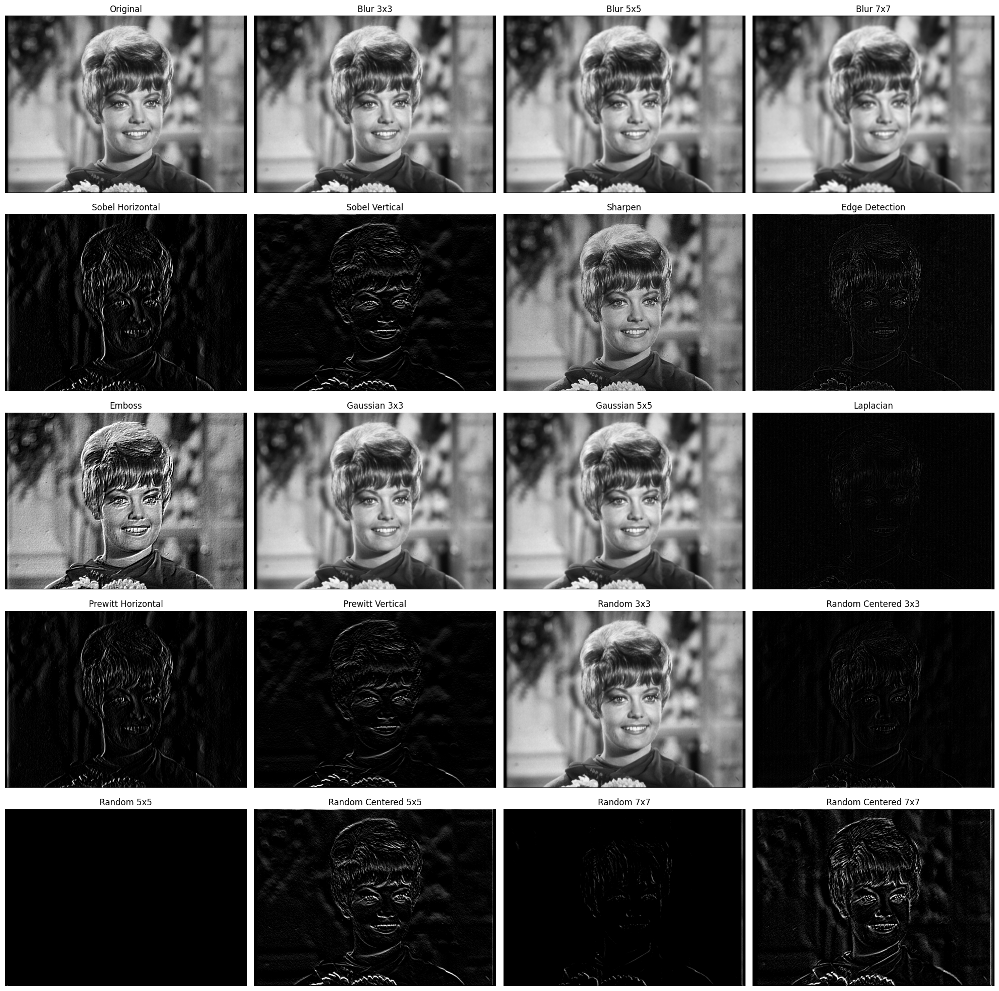

Affichage des résultats - Image RGB


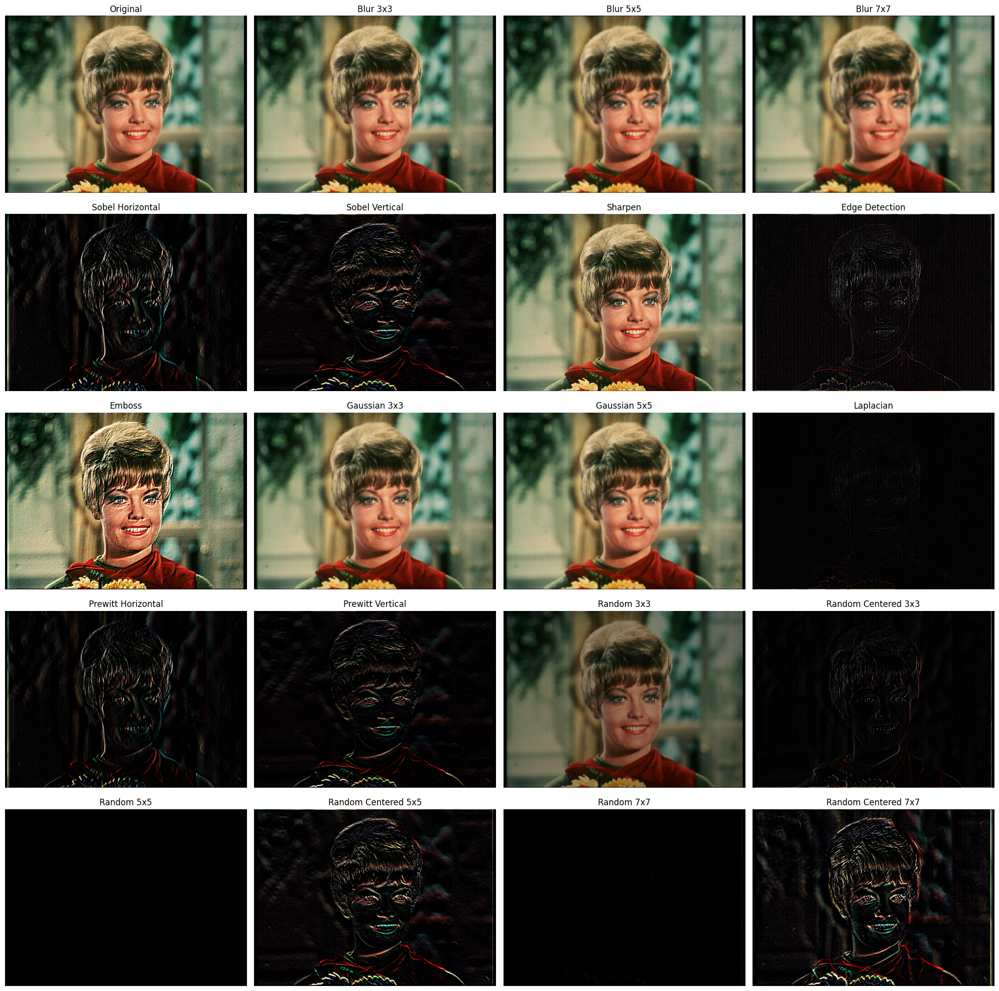


=== Sauvegarde des résultats ===
Résultats sauvegardés avec le préfixe 'gray'
Résultats sauvegardés avec le préfixe 'rgb'

=== Analyse comparative - Filtres Sobel ===


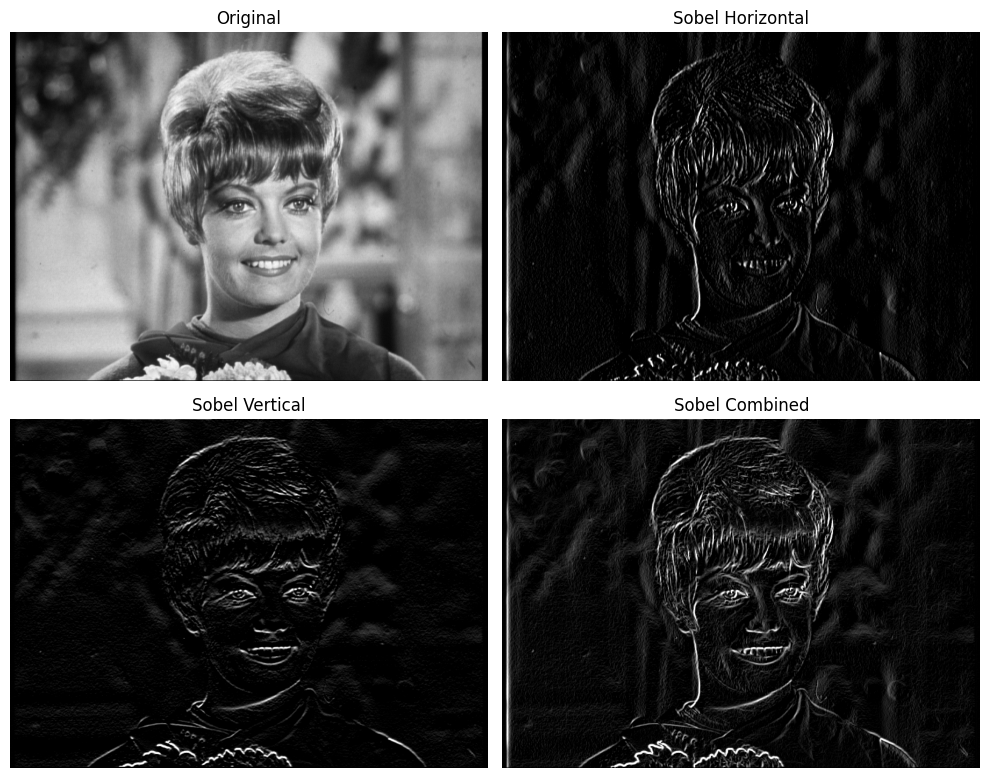

In [ ]:
# Fonction pour charger une image automatiquement
def image_load(image_path, channel=None):
    # Vérifier si le fichier existe
    assert os.path.exists(image_path), f"Erreur : Le fichier {image_path} n'existe pas"

    # Charger l'image en couleur d'abord
    image_bgr = cv2.imread(image_path)
    assert image_bgr is not None, f"Erreur : Impossible de charger l'image {image_path}"

    # Convertir BGR en RGB
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

    # Charger aussi en niveaux de gris
    image_gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    assert image_gray is not None, "Erreur : Impossible de charger l'image en niveaux de gris"

    # Auto-détection ou sélection manuelle
    if channel is None:
        # Retourner les deux versions
        return image_rgb, image_gray
    elif channel == 1:
        # Assertions pour image en niveaux de gris
        assert len(image_gray.shape) == 2, "L'image en niveaux de gris doit être 2D"
        return image_gray, True
    elif channel == 3:
        # Assertions pour image RGB
        assert len(image_rgb.shape) == 3, "L'image RGB doit être 3D"
        assert image_rgb.shape[2] == 3, "L'image RGB doit avoir 3 canaux"
        return image_rgb, False
    else:
        raise ValueError("Le paramètre channel doit être 1, 3 ou None")

def convolve_channel(image, kernel):
    # Assertions pour valider les dimensions
    assert len(image.shape) == 2, "L'image doit être 2D pour un canal"
    assert len(kernel.shape) == 2, "Le noyau doit être 2D"
    assert image.shape[0] >= kernel.shape[0], "L'image est trop petite pour le noyau en hauteur"
    assert image.shape[1] >= kernel.shape[1], "L'image est trop petite pour le noyau en largeur"

    # Dimensions de l'image et du noyau
    img_height, img_width = image.shape
    kernel_height, kernel_width = kernel.shape
    pad_height, pad_width = kernel_height // 2, kernel_width // 2

    # Ajouter un padding pour gérer les bords
    padded_image = np.pad(image, ((pad_height, pad_height), (pad_width, pad_width)), mode='constant')
    output = np.zeros_like(image, dtype=np.float32)

    # Assertion pour la taille de sortie
    assert output.shape == image.shape, "La taille de sortie doit correspondre à l'image originale"

    # Appliquer la convolution
    for i in range(img_height):
        for j in range(img_width):
            region = padded_image[i:i + kernel_height, j:j + kernel_width]
            output[i, j] = np.sum(region * kernel)

    return output

def apply_convolution(image, kernel):
    # Assertions pour valider les entrées
    assert isinstance(image, np.ndarray), "L'image doit être un tableau NumPy"
    assert isinstance(kernel, np.ndarray), "Le noyau doit être un tableau NumPy"
    assert len(kernel.shape) == 2, "Le noyau doit être une matrice 2D"
    assert kernel.shape[0] == kernel.shape[1], "Le noyau doit être carré"
    assert kernel.shape[0] % 2 == 1, "Le noyau doit avoir une taille impaire"
    assert len(image.shape) in [2, 3], "L'image doit être en niveaux de gris (2D) ou RGB (3D)"

    if len(image.shape) == 3:  # Image RGB
        assert image.shape[2] == 3, "L'image RGB doit avoir 3 canaux"
        height, width, channels = image.shape
        output = np.zeros_like(image, dtype=np.float32)

        # Appliquer le filtre sur chaque canal
        for c in range(channels):
            output[:, :, c] = convolve_channel(image[:, :, c], kernel)

        # Assertion pour la taille de sortie RGB
        assert output.shape == image.shape, "La taille de sortie RGB doit correspondre à l'image originale"
    else:  # Image en niveaux de gris
        output = convolve_channel(image, kernel)
        # Assertion pour la taille de sortie en niveaux de gris
        assert output.shape == image.shape, "La taille de sortie en niveaux de gris doit correspondre à l'image originale"

    # Normaliser pour éviter des valeurs hors plage [0, 255]
    output = np.clip(output, 0, 255).astype(np.uint8)
    return output

def display_images(images_dict, original_title="Image originale", cols=3):
    n_images = len(images_dict)
    rows = (n_images + cols - 1) // cols

    plt.figure(figsize=(5 * cols, 4 * rows))

    for i, (title, image) in enumerate(images_dict.items()):
        plt.subplot(rows, cols, i + 1)
        plt.title(title)

        # Déterminer si c'est une image en niveaux de gris
        if len(image.shape) == 2:
            plt.imshow(image, cmap='gray')
        else:
            plt.imshow(image)

        plt.axis('off')

    plt.tight_layout()
    plt.show()

def create_kernels():
    kernels = {}

    # 1. Filtre de flou (moyenne) - différentes tailles
    kernels['Blur 3x3'] = np.ones((3, 3)) / 9
    kernels['Blur 5x5'] = np.ones((5, 5)) / 25
    kernels['Blur 7x7'] = np.ones((7, 7)) / 49

    # 2. Filtres Sobel
    kernels['Sobel Horizontal'] = np.array([
        [-1, 0, 1],
        [-2, 0, 2],
        [-1, 0, 1]
    ])

    kernels['Sobel Vertical'] = np.array([
        [-1, -2, -1],
        [0, 0, 0],
        [1, 2, 1]
    ])

    # 3. Filtre de netteté (Sharpening)
    kernels['Sharpen'] = np.array([
        [0, -1, 0],
        [-1, 5, -1],
        [0, -1, 0]
    ])

    # 4. Détection de contours (Edge Detection)
    kernels['Edge Detection'] = np.array([
        [-1, -1, -1],
        [-1, 8, -1],
        [-1, -1, -1]
    ])

    # 5. Emboss
    kernels['Emboss'] = np.array([
        [-2, -1, 0],
        [-1, 1, 1],
        [0, 1, 2]
    ])

    # 6. Gaussian Blur
    kernels['Gaussian 3x3'] = np.array([
        [1, 2, 1],
        [2, 4, 2],
        [1, 2, 1]
    ]) / 16

    # 7. Gaussian Blur 5x5
    kernels['Gaussian 5x5'] = np.array([
        [1, 4, 6, 4, 1],
        [4, 16, 24, 16, 4],
        [6, 24, 36, 24, 6],
        [4, 16, 24, 16, 4],
        [1, 4, 6, 4, 1]
    ]) / 256

    # 8. Laplacian
    kernels['Laplacian'] = np.array([
        [0, 1, 0],
        [1, -4, 1],
        [0, 1, 0]
    ])

    # 9. Prewitt Horizontal
    kernels['Prewitt Horizontal'] = np.array([
        [-1, 0, 1],
        [-1, 0, 1],
        [-1, 0, 1]
    ])

    # 10. Prewitt Vertical
    kernels['Prewitt Vertical'] = np.array([
        [-1, -1, -1],
        [0, 0, 0],
        [1, 1, 1]
    ])

    return kernels

def create_random_kernels(seed=42):
    np.random.seed(seed)
    random_kernels = {}

    sizes = [3, 5, 7]
    for size in sizes:
        # Noyau aléatoire normalisé
        kernel = np.random.randn(size, size)
        kernel = kernel / np.sum(np.abs(kernel))  # Normalisation
        random_kernels[f'Random {size}x{size}'] = kernel

        # Noyau aléatoire centré
        kernel_centered = np.random.randn(size, size)
        kernel_centered[size//2, size//2] = -np.sum(kernel_centered) + kernel_centered[size//2, size//2]
        random_kernels[f'Random Centered {size}x{size}'] = kernel_centered

    return random_kernels

def download_test_image():
    test_image_url = "https://upload.wikimedia.org/wikipedia/commons/5/50/Vd-Orig.png"
    local_filename = "test_image.png"

    if not os.path.exists(local_filename):
        try:
            urlretrieve(test_image_url, local_filename)
            print(f"Image de test téléchargée : {local_filename}")
        except:
            print("Impossible de télécharger l'image de test. Veuillez fournir une image manuellement.")
            return None

    return local_filename

def save_results(images_dict, prefix="result"):
    for name, image in images_dict.items():
        # Nettoyer le nom pour le nom de fichier
        clean_name = name.replace(" ", "_").replace("/", "_").lower()
        filename = f"{prefix}_{clean_name}.jpg"

        if len(image.shape) == 3:  # Image RGB
            # Convertir RGB en BGR pour OpenCV
            cv2.imwrite(filename, cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
        else:  # Image en niveaux de gris
            cv2.imwrite(filename, image)

    print(f"Résultats sauvegardés avec le préfixe '{prefix}'")

def main():
    print("=== TP : Application des Filtres de Convolution sur les Images ===\n")

    # 1. Charger une image de test
    image_path = "/content/ZeldaColor.bmp"

    # Télécharger une image de test si nécessaire
    if not os.path.exists(image_path):
        image_path = download_test_image()
        if image_path is None:
            print("Veuillez placer une image nommée 'test_image.png' dans le répertoire.")
            return

    # Charger l'image en RGB et en niveaux de gris
    try:
        rgb_image, gray_image = image_load(image_path)
        print(f"Image chargée avec succès : {image_path}")
        print(f"Dimensions RGB : {rgb_image.shape}")
        print(f"Dimensions niveaux de gris : {gray_image.shape}")
    except Exception as e:
        print(f"Erreur lors du chargement de l'image : {e}")
        return

    # 2. Créer tous les noyaux
    print("\n=== Création des noyaux de convolution ===")
    kernels = create_kernels()
    random_kernels = create_random_kernels(seed=42)
    all_kernels = {**kernels, **random_kernels}

    print(f"Nombre total de noyaux créés : {len(all_kernels)}")
    for name in all_kernels.keys():
        print(f"- {name}")

    # 3. Appliquer les filtres sur l'image en niveaux de gris
    print("\n=== Application des filtres sur l'image en niveaux de gris ===")
    gray_results = {"Original": gray_image}

    for name, kernel in all_kernels.items():
        try:
            filtered = apply_convolution(gray_image, kernel)
            gray_results[name] = filtered
            print(f"✓ {name} appliqué sur l'image en niveaux de gris")
        except Exception as e:
            print(f"✗ Erreur avec {name} sur l'image en niveaux de gris : {e}")

    # 4. Appliquer les filtres sur l'image RGB
    print("\n=== Application des filtres sur l'image RGB ===")
    rgb_results = {"Original": rgb_image}

    for name, kernel in all_kernels.items():
        try:
            filtered = apply_convolution(rgb_image, kernel)
            rgb_results[name] = filtered
            print(f"✓ {name} appliqué sur l'image RGB")
        except Exception as e:
            print(f"✗ Erreur avec {name} sur l'image RGB : {e}")

    # 5. Afficher les résultats
    print("\n=== Affichage des résultats ===")

    # Afficher les résultats pour l'image en niveaux de gris
    print("Affichage des résultats - Image en niveaux de gris")
    display_images(gray_results, cols=4)

    # Afficher les résultats pour l'image RGB
    print("Affichage des résultats - Image RGB")
    display_images(rgb_results, cols=4)

    # 6. Sauvegarder les résultats
    print("\n=== Sauvegarde des résultats ===")
    save_results(gray_results, "gray")
    save_results(rgb_results, "rgb")

    # 7. Analyse comparative pour les filtres Sobel
    print("\n=== Analyse comparative - Filtres Sobel ===")
    sobel_comparison = {
        "Original": gray_image,
        "Sobel Horizontal": gray_results["Sobel Horizontal"],
        "Sobel Vertical": gray_results["Sobel Vertical"]
    }

    # Combinaison des filtres Sobel
    sobel_combined = np.sqrt(
        gray_results["Sobel Horizontal"].astype(np.float32)**2 +
        gray_results["Sobel Vertical"].astype(np.float32)**2
    )
    sobel_combined = np.clip(sobel_combined, 0, 255).astype(np.uint8)
    sobel_comparison["Sobel Combined"] = sobel_combined

    display_images(sobel_comparison, cols=2)


if __name__ == "__main__":
    main()